In [26]:
from skimage import io, morphology, color, util, filters, draw
import numpy as np
from PIL import Image

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="darkgrid", palette="Set2")

data = "data/"

In [27]:
img_overview = pd.read_csv(data+"image_overview.csv")
img_overview

,input_img_fname,target_img_fname,binary_threshold
0,0_brightfield.jpg,0_fluorescence.jpg,15
1,1_brightfield.jpg,1_fluorescence.jpg,15
2,2_brightfield.jpg,2_fluorescence.jpg,15
3,3_brightfield.jpg,3_fluorescence.jpg,15
4,4_brightfield.jpg,4_fluorescence.jpg,15
5,5_brightfield.jpg,5_fluorescence.jpg,15
6,6_brightfield.jpg,6_fluorescence.jpg,15
7,7_brightfield.jpg,7_fluorescence.jpg,15
8,8_brightfield_chsC.jpg,8_fluorescence_chsC.jpg,15
9,9_brightfield_chsC.jpg,9_fluorescence_chsC.jpg,15


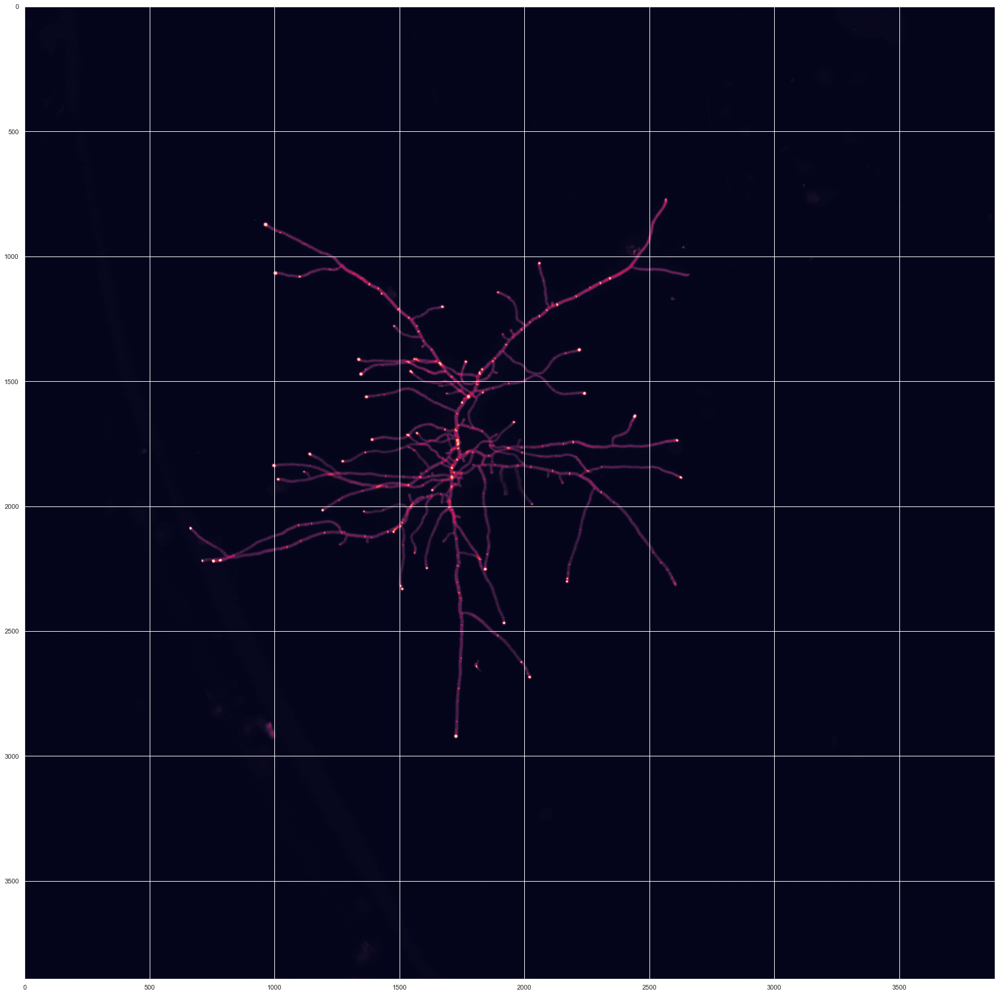

In [73]:
idx = 2

bf_fname = img_overview.at[idx, "input_img_fname"]
fl_fname = img_overview.at[idx, "target_img_fname"]

bf_img  = io.imread(data + bf_fname)[:,:,0]
fl_img  = io.imread(data + fl_fname)

fl_img = fl_img[:,:,2]

fl_img = util.img_as_ubyte(fl_img)

plt.figure(figsize=[40,30])
plt.imshow(fl_img)

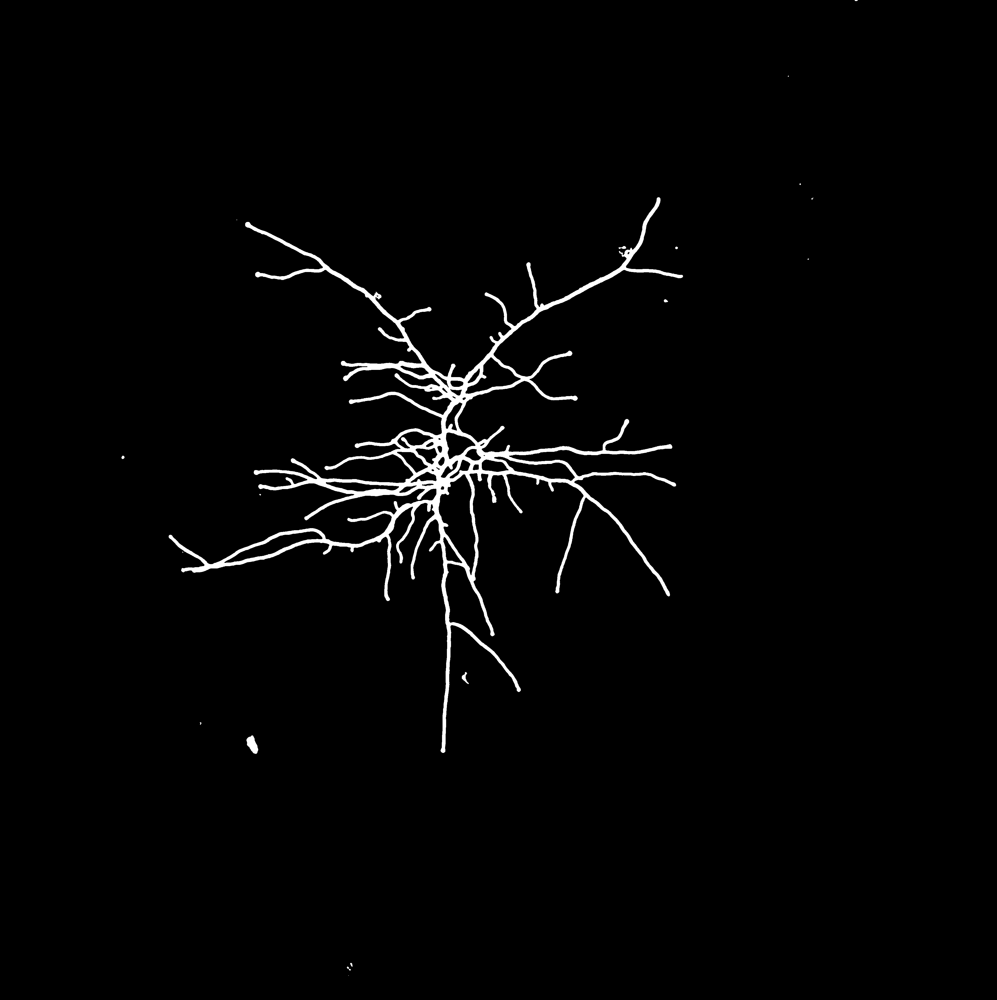

In [80]:
#threshold = img_overview.at[idx, "binary_threshold"]
threshold = 15

bin_img = fl_img.copy()
bin_img[bin_img >= threshold] = 255
bin_img[bin_img < threshold] = 0

bin_img = bin_img.astype(np.bool)

bin_img = filters.median(bin_img, selem=morphology.square(5))

Image.fromarray(bin_img)

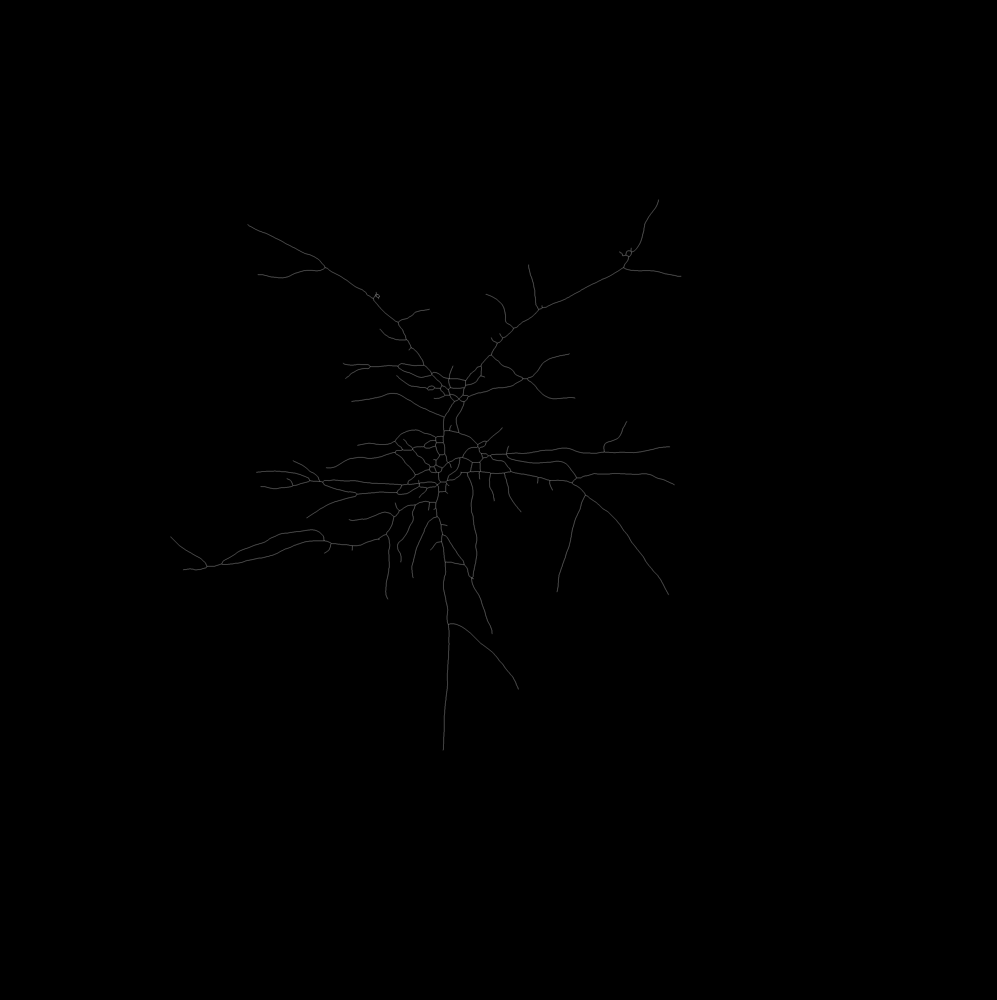

In [81]:
ske_img = morphology.skeletonize(bin_img)
ske_img = morphology.remove_small_objects(ske_img, min_size=1000, connectivity=2)


Image.fromarray(ske_img)

In [82]:
import sknw

# build graph from skeleton
graph = sknw.build_sknw(ske_img)
    
# draw node by o
nodes = graph.nodes()
bs = np.array([nodes[i]['o'] for i in nodes if len(graph.edges(i))>=3])
ts = np.array([nodes[i]['o'] for i in nodes if len(graph.edges(i))<=2])


In [83]:
branch_mask = np.zeros(ske_img.shape, dtype=np.bool)
tip_mask = np.zeros(ske_img.shape, dtype=np.bool)

b_rad = 18
t_rad = 9
b_selem = morphology.disk(b_rad)
t_selem = morphology.disk(tip_radius)
dims = ske_img.shape

for x,y in bs:
    x,y = int(x), int(y)
    
    # for edge cases, don't use selem, just square
    if dims[0] - x < b_rad + 1 or dims[1] - y < b_rad + 1 or x < b_rad or y < b_rad:
        branch_mask[x-b_rad:x+b_rad+1, y-b_rad:y+b_rad+1] = True
    else:
        # use binary or to avoid overwriting with 0's
        branch_mask[x-b_rad:x+b_rad+1, y-b_rad:y+b_rad+1] = branch_mask[x-b_rad:x+b_rad+1, y-b_rad:y+b_rad+1] | b_selem

for x,y in ts:
    x,y = int(x), int(y)
    
    # for edge cases, don't use selem, just square
    if dims[0] - x < t_rad + 1 or dims[1] - y < t_rad + 1 or x < t_rad or y < t_rad:
        tip_mask[x-t_rad:x+t_rad+1, y-t_rad:y+t_rad+1] = True
    else:
        # use binary or to avoid overwriting with 0's
        tip_mask[x-t_rad:x+t_rad+1, y-t_rad:y+t_rad+1] = tip_mask[x-t_rad:x+t_rad+1, y-t_rad:y+t_rad+1] | t_selem
    

branch_mask = branch_mask & bin_img
tip_mask = tip_mask & bin_img

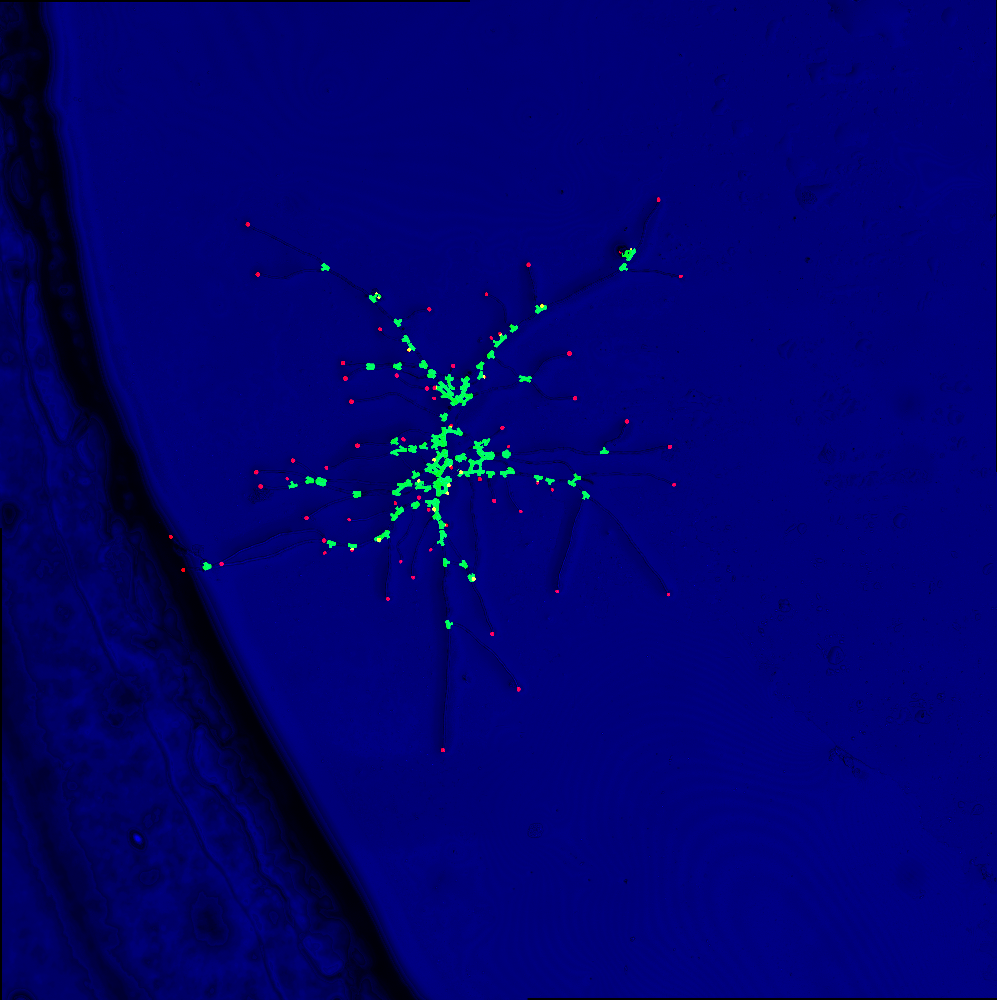

In [84]:
tip_mask = (tip_mask*255).astype(np.uint8)
branch_mask = (branch_mask*255).astype(np.uint8)

final_mask = np.array([tip_mask, branch_mask, bf_img[0:dims[0], 0:dims[1]]])

Image.fromarray(final_mask.swapaxes(0,2).swapaxes(0,1))

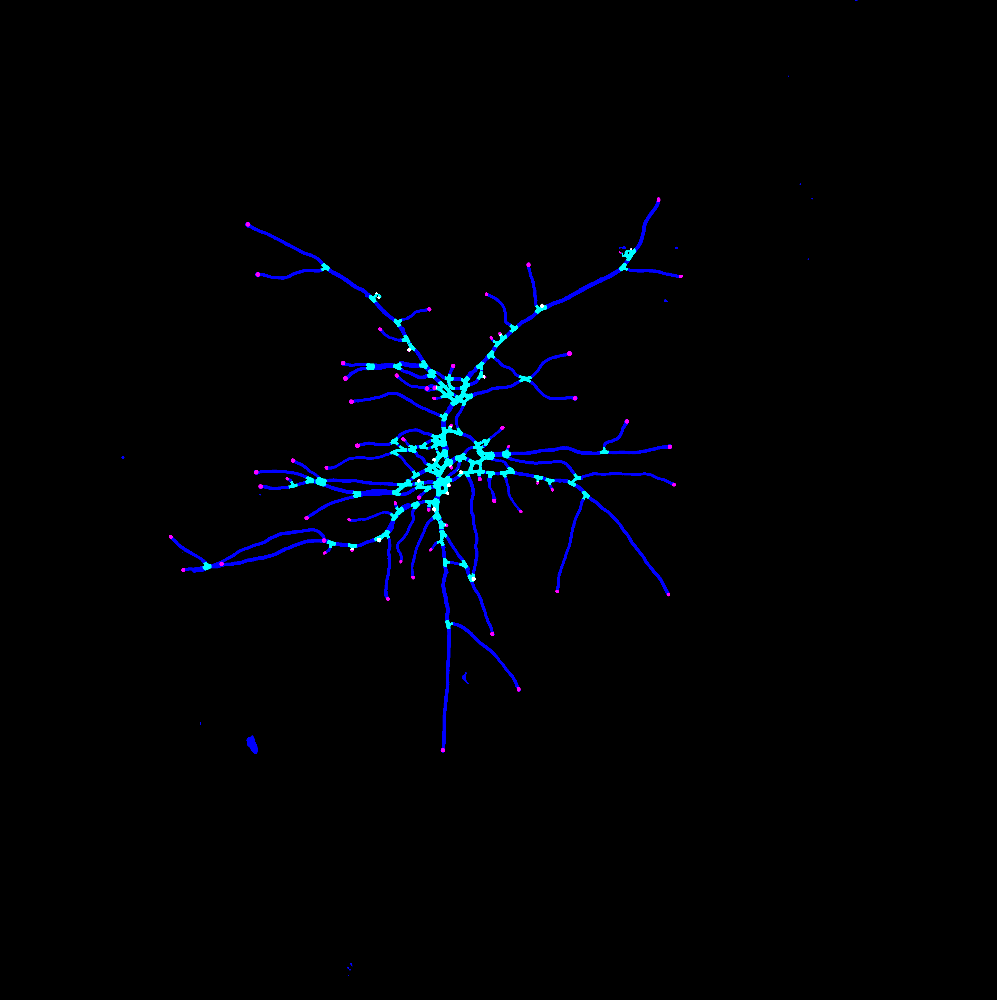

In [85]:
bin_img_256 = (bin_img*255).astype(np.uint8)

final_mask_2 = np.array([tip_mask, branch_mask, bin_img_256])

final_mask_2 = final_mask_2.swapaxes(0,2).swapaxes(0,1)

Image.fromarray(final_mask_2)